# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [1]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [3]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5,1,'Original Image')

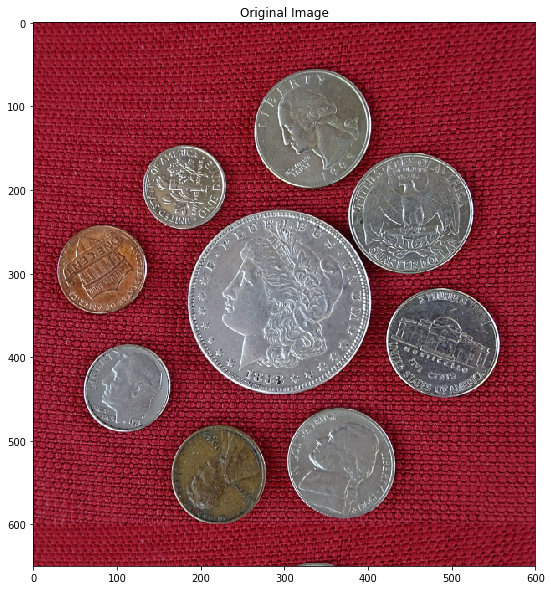

In [247]:
# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable image
image = cv2.imread(imagePath) # default: cv2.IMREAD_COLOR

imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [248]:
# Convert image to grayscale
# Store it in the variable imageGray
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

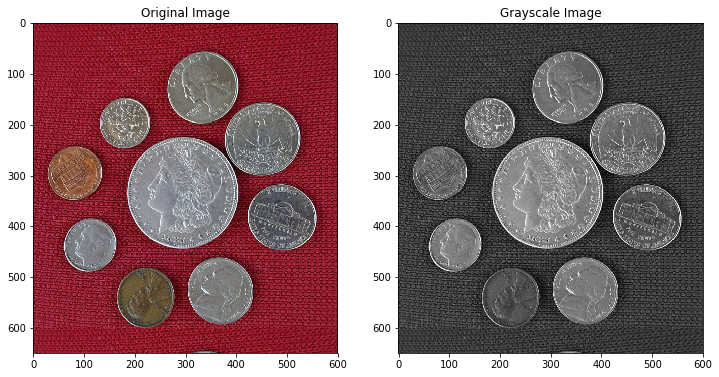

In [249]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [250]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
imageB, imageG, imageR = cv2.split(image)


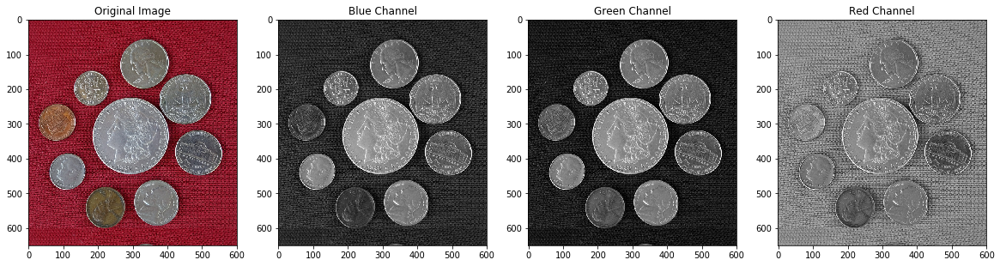

In [251]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

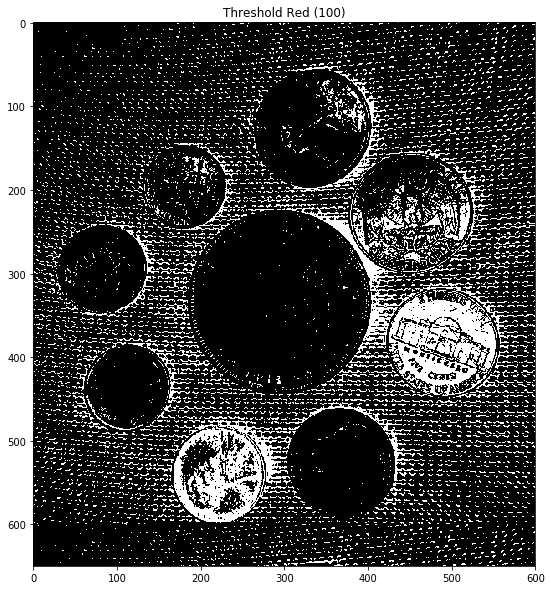

In [255]:
# imageR is too washed out and was ruled out after a quick try
ret, imageTh = cv2.threshold(imageR, 100, 255, cv2.THRESH_BINARY_INV)
plt.imshow(imageTh);plt.title("Threshold Red (100)");

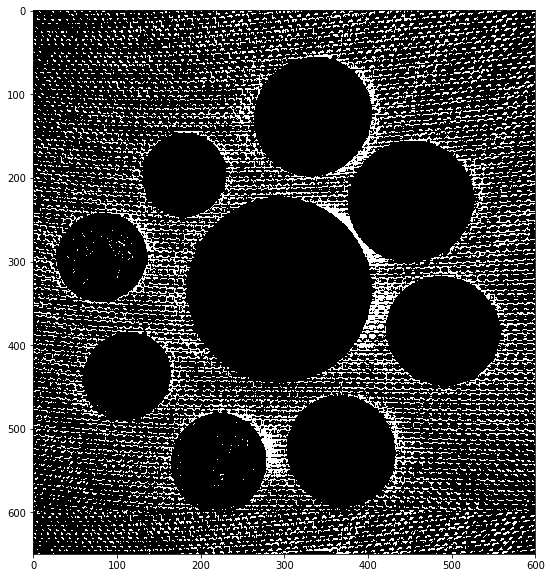

In [254]:
# imageB is unable to be as convincing as imageG (or imageGray)
ret, imageTh = cv2.threshold(imageB, 25, 255, cv2.THRESH_BINARY_INV)
plt.imshow(imageTh); plt.title("Threshold Blue (25)")

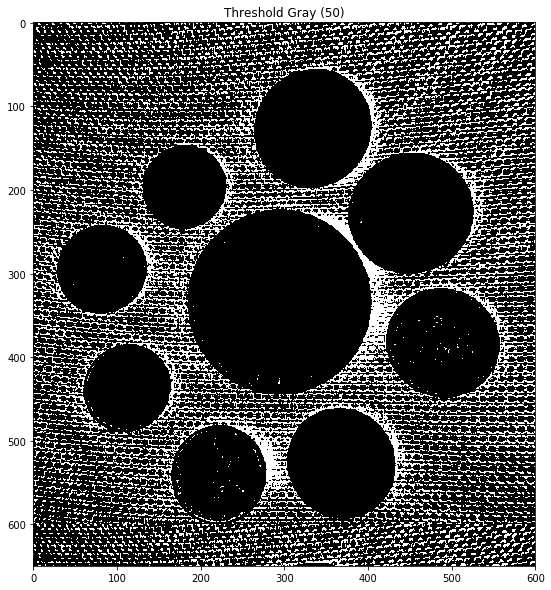

In [257]:
# imageGray is close but the edges of some of the coins is not as crisp as imageG
ret, imageTh = cv2.threshold(imageGray, 50, 255, cv2.THRESH_BINARY_INV)
plt.imshow(imageTh); plt.title("Threshold Gray (50)");

In [50]:
# NOTE: imageGray and imageG looks very promising to the human eye. 

# NOTE: for each of the images, I tried changing the threshold (0-100) till I was able to achieve the desired result
# of getting the coins as clearly identified in the resulting image. I chose threshold of 20 for imageG
ret, imageTh = cv2.threshold(imageG, 20, 255, cv2.THRESH_BINARY_INV)

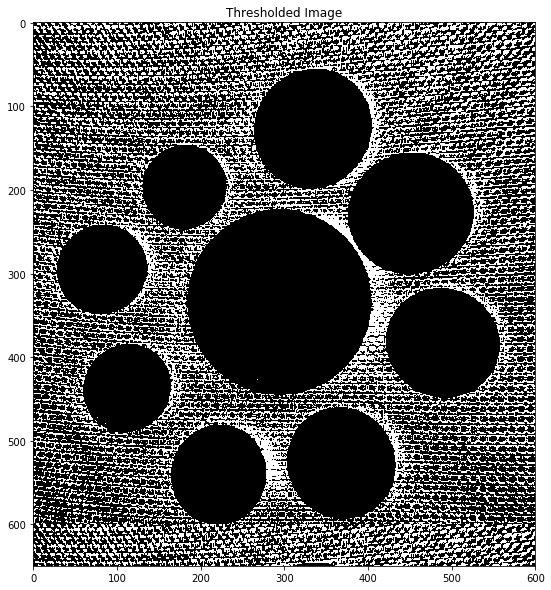

In [58]:
# Display the thresholded image
plt.imshow(imageTh)
plt.title("Thresholded Image");

## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [73]:
# Dilation
# Both MORPH_RECT and MORPH_CROSS shapes will not be appropriate when dealing with circular shapes.
# So, I went with MORPH_ELLISE
# I tried different kernel sizes starting with (3, 3), (5, 5), (7, 7), (9, 9), (11, 11)
imageDilated = []
for i in range(3,12,2):
    kSize = (i, i)
    kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kSize)
    imageDilated.append(cv2.dilate(imageTh, kernel1))
# kernel size (3, 3) is too small.

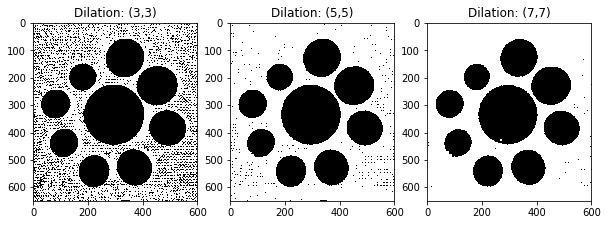

In [79]:
plt.subplot(1,3,1);plt.imshow(imageDilated[0]);plt.title("Dilation: (3,3)"); # quite noisy
plt.subplot(1,3,2);plt.imshow(imageDilated[1]);plt.title("Dilation: (5,5)");
plt.subplot(1,3,3);plt.imshow(imageDilated[2]);plt.title("Dilation: (7,7)"); # still some noise

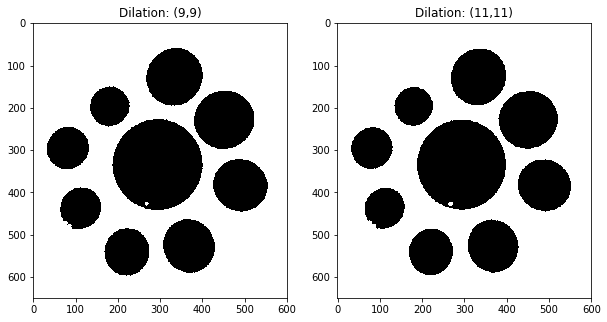

In [82]:
plt.subplot(1,2,1);plt.imshow(imageDilated[3]);plt.title("Dilation: (9,9)"); # (9,9) seems ok
plt.subplot(1,2,2);plt.imshow(imageDilated[4]);plt.title("Dilation: (11,11)"); # (11,11) the white hole starts becoming bigger

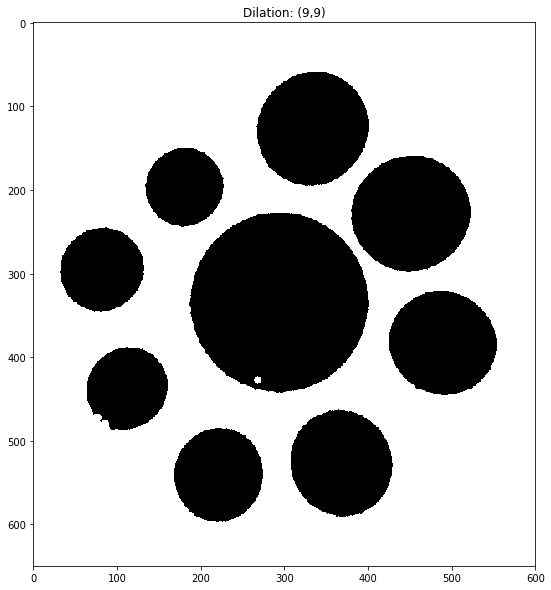

In [83]:
kSize = (9,9)
kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kSize)
imageDilated = cv2.dilate(imageTh, kernel1)

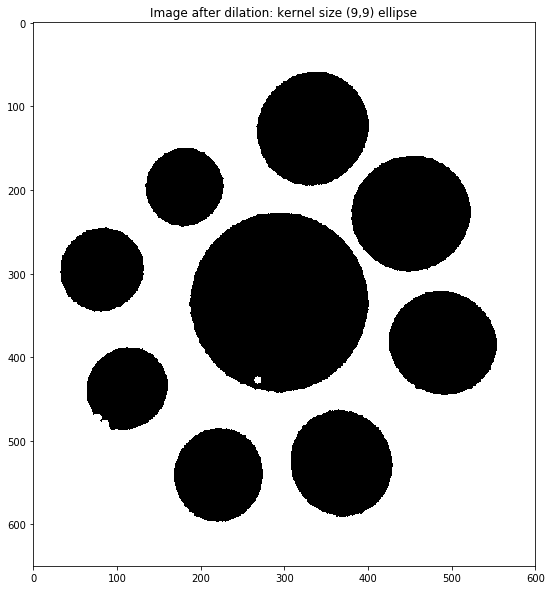

In [84]:
# Display all the images
# you have obtained in the intermediate steps
plt.imshow(imageDilated);plt.title("Image after dilation: kernel size (9,9) ellipse");

In [93]:
# Get structuring element/kernel which will be used for erosion
imageEroded = []
for i in range(5,14,2): # start with 5 as we need to erode the hole in the big coin in the center
    kSize = (i, i)
    kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kSize)
    imageEroded.append(cv2.erode(imageDilated, kernel1))

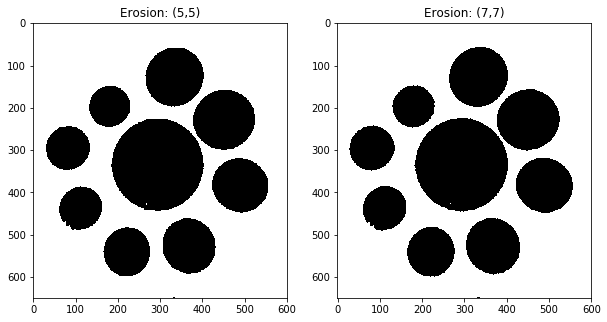

In [97]:
plt.subplot(1,2,1);plt.imshow(imageEroded[0]);plt.title("Erosion: (5,5)");
plt.subplot(1,2,2);plt.imshow(imageEroded[1]);plt.title("Erosion: (7,7)");

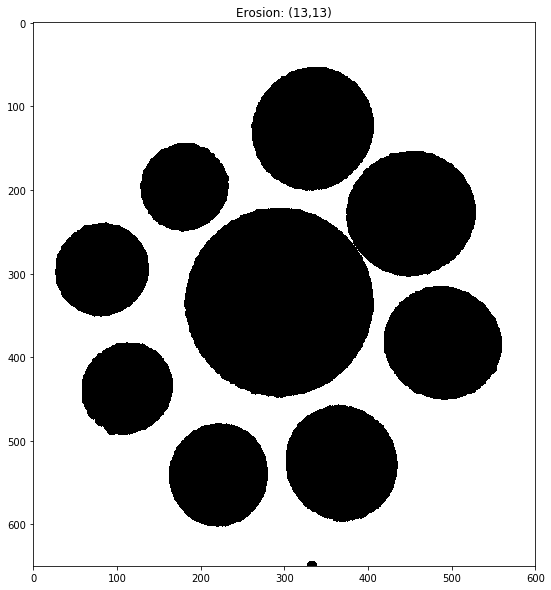

In [106]:
#plt.imshow(imageEroded[2]);plt.title("Erosion: (9,9)"); # still has not completely eroded the hole
plt.imshow(imageEroded[3]);plt.title("Erosion: (11,11)"); # (11, 11) has done the job of eroding but the blob at the bottom
#plt.imshow(imageEroded[4]);plt.title("Erosion: (13,13)"); # is getting more prominent, so (11, 11) seems to be ok

In [109]:
kSize = (11,11)
kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kSize)
imageEroded = cv2.erode(imageDilated, kernel1)

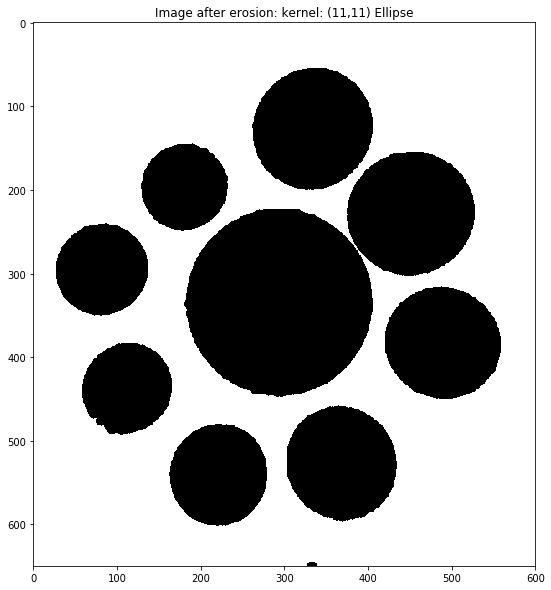

In [110]:
plt.imshow(imageEroded);plt.title("Image after erosion: kernel: (11,11) Ellipse");

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [112]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [113]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [116]:
# Detect blobs
keypoints = detector.detect(imageEroded)

In [117]:
# Print number of coins detected
print('Number of coins detected = {}'.format(len(keypoints)))


Number of coins detected = 9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [119]:
im = image.copy()
# Mark coins using image annotation concepts we have studied so far
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in blue
    cv2.circle(im,(x,y),5,(255,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in yellow
    cv2.circle(im,(x,y),radius,(0,255,255),2)

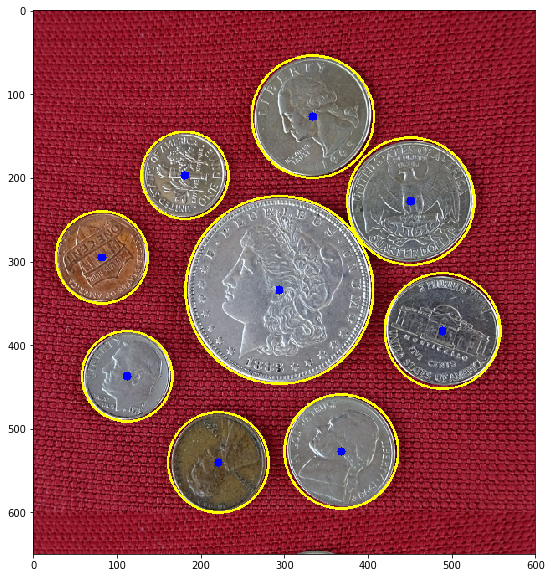

In [120]:
# Display the final image
plt.imshow(im[:,:,::-1]);


## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [134]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [135]:
# Find connected components
_, imThresh = cv2.threshold(imageEroded, 0, 255, cv2.THRESH_BINARY_INV)
#plt.imshow(imThresh)
_, imLabels = cv2.connectedComponents(imThresh)


Number of connected components detected = 10


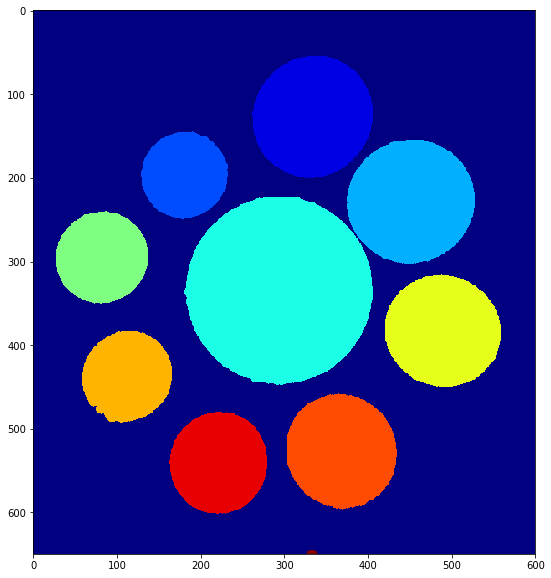

In [136]:
# Print number of connected components detected
print('Number of connected components detected = {}'.format(imLabels.max()))
displayConnectedComponents(imLabels) # includes 1. background, 9 coins and the tiny blob at the bottom of the picture

In [155]:
# in order to remove the extra component, we can use connectedComponentsWithStats
output = cv2.connectedComponentsWithStats(imThresh)
num_labels = output[0]
labels = output[1]
stats = output[2]
print(stats) # you can see that the last component has a small area (50) and starts at y=644
threshold_indices = labels > 9
labels[threshold_indices] = 0 # make the last label be part of background

[[     0      0    600    650 249607]
 [   262     54    144    147  16427]
 [   129    145    104    105   8371]
 [   375    155    153    149  17725]
 [   181    223    225    225  39257]
 [    27    240    111    111   9488]
 [   421    316    138    136  14551]
 [    59    383    107    110   9133]
 [   303    458    132    139  14210]
 [   163    480    117    122  11181]
 [   328    644     11      6     50]]


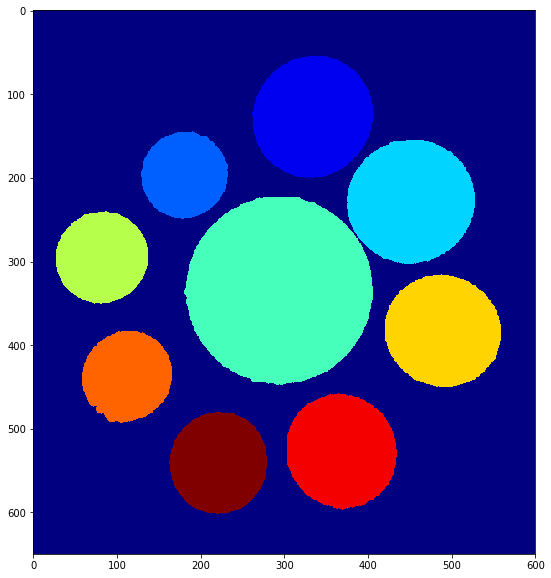

In [154]:
# Display connected components using displayConnectedComponents
displayConnectedComponents(labels)

## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [179]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(imageEroded, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# NOTE: imThresh works better here, it still detects 10 contours but the 10th one is the smallest

In [180]:
# Print the number of contours found
print("Number of contours found = {}".format(len(contours)))


Number of contours found = 10


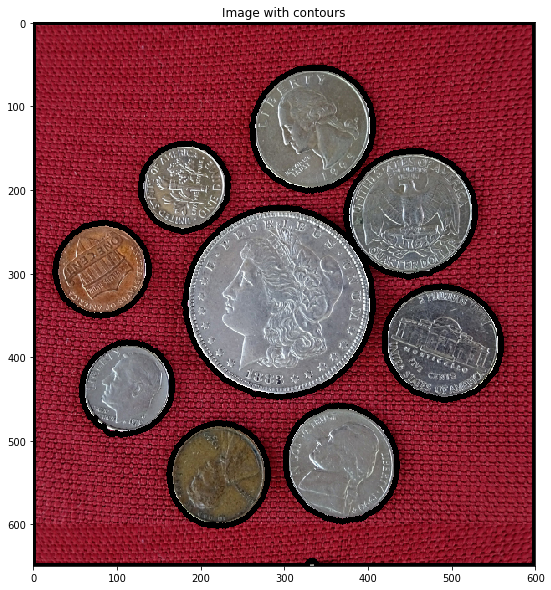

In [182]:
# Draw all contours
im = image.copy()
cv2.drawContours(im, contours, -1, (0,0,0), 5)
plt.imshow(im[:,:,::-1]); plt.title('Image with contours');

Let's only consider the outer contours.

Number of contours found = 1


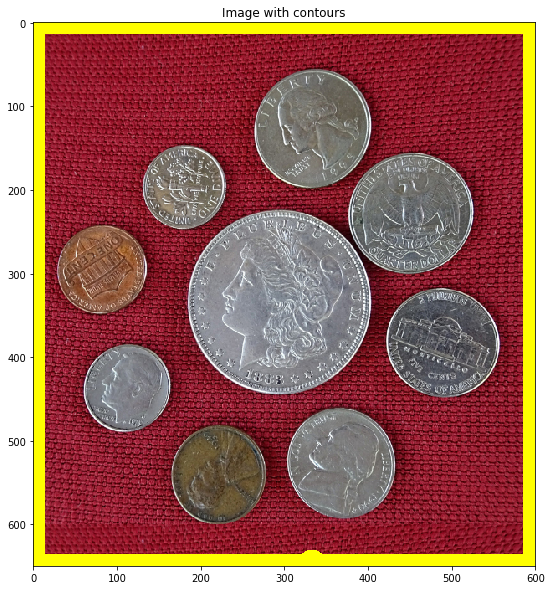

In [186]:
# Remove the inner contours
# Display the result
contours, hierarchy = cv2.findContours(imageEroded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = {}".format(len(contours)))
im = image.copy()
cv2.drawContours(im, contours, -1, (0,255,255), 25)
plt.imshow(im[:,:,::-1]); plt.title('Image with contours');

So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [195]:
# Print area and perimeter of all contours
contours, hierarchy = cv2.findContours(imageEroded, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
maxArea = 0.0
maxAreaIndex = 0
for index,ctr in enumerate(contours):
    area = cv2.contourArea(ctr)
    perimeter = cv2.arcLength(ctr, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))
    if area > maxArea:
        maxArea = area
        maxAreaIndex = index

Contour #1 has area = 11350.5 and perimeter = 402.71781611442566
Contour #2 has area = 14402.5 and perimeter = 460.31579542160034
Contour #3 has area = 9291.5 and perimeter = 374.91882729530334
Contour #4 has area = 14746.0 and perimeter = 460.759446144104
Contour #5 has area = 9644.5 and perimeter = 372.5756813287735
Contour #6 has area = 39574.5 and perimeter = 755.8792839050293
Contour #7 has area = 17939.0 and perimeter = 509.52899944782257
Contour #8 has area = 8518.5 and perimeter = 350.43354511260986
Contour #9 has area = 16633.0 and perimeter = 488.55843675136566
Contour #10 has area = 388699.0 and perimeter = 2503.3137080669403


In [196]:
# Print maximum area of contour
# This will be the box that we want to remove
print('Maximum area of contour = {}'.format(maxArea))

Maximum area of contour = 388699.0


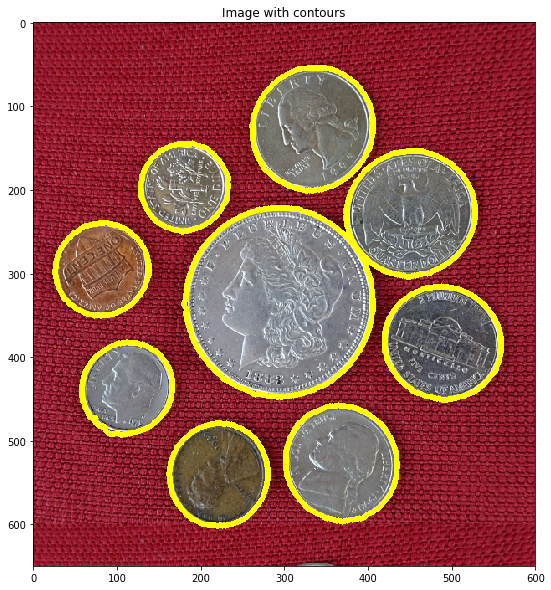

In [197]:
# Remove the contour with the max area and plot others
contours = contours[:-1]
im = image.copy()
cv2.drawContours(im, contours, -1, (0,255,255), 5)
plt.imshow(im[:,:,::-1]); plt.title('Image with contours');

Number of coins detected = 9


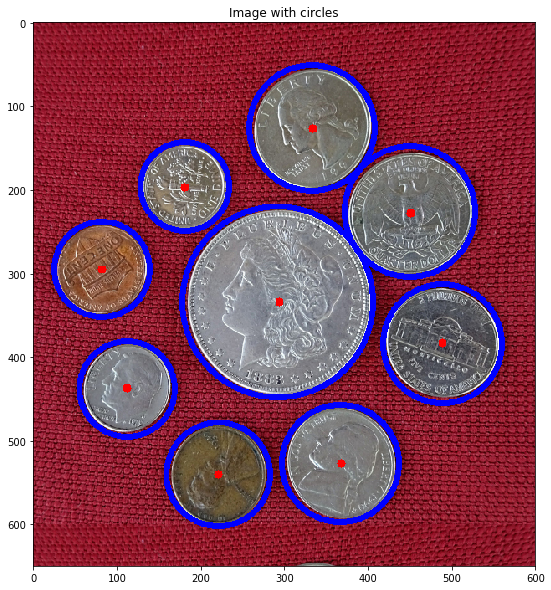

In [202]:
# Fit circles on coins
print('Number of coins detected = {}'.format(len(contours)))
im = image.copy()
for ctr in contours:
    # We will use the contour moments
    # to find the centroid
    M = cv2.moments(ctr)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    
    # Mark the center
    cv2.circle(im, (x,y), 5, (0,0,255), -1);
    
    # Fit a circle
    ((x,y),radius) = cv2.minEnclosingCircle(ctr)
    cv2.circle(im, (int(x),int(y)), int(round(radius)), (255,0,0), 5)
plt.imshow(im[:,:,::-1]); plt.title('Image with circles');

# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

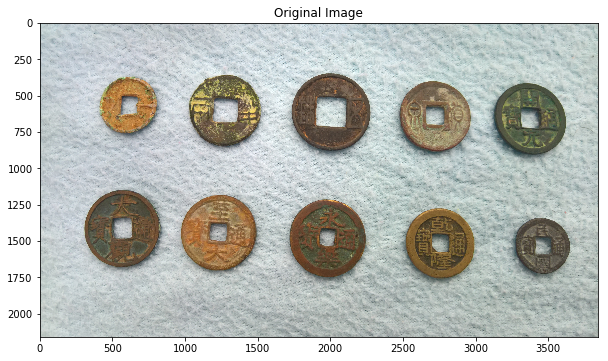

In [549]:
# Image path
imagePath = DATA_PATH + "images/CoinsB.png"
# Read image
# Store it in variable image
image = cv2.imread(imagePath)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image");

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [259]:
# Convert to grayscale
# Store in variable imageGray
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


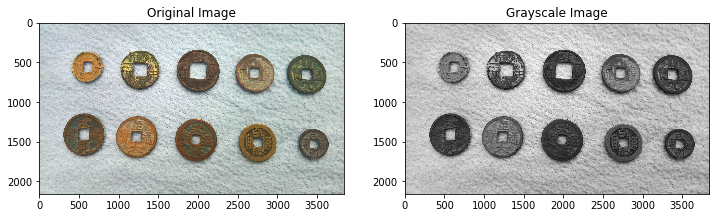

In [260]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [261]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
imageB, imageG, imageR = cv2.split(image)

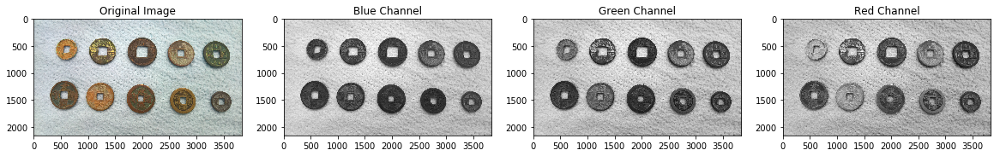

In [262]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

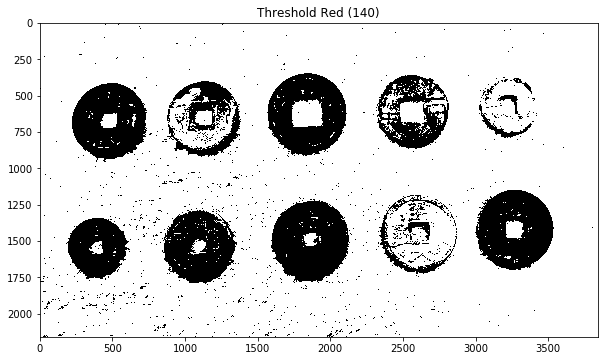

In [270]:
# imageR
ret, imageTh = cv2.threshold(imageR, 140, 255, cv2.THRESH_BINARY)
plt.imshow(imageTh[...,::-1]); plt.title("Threshold Red (140)");

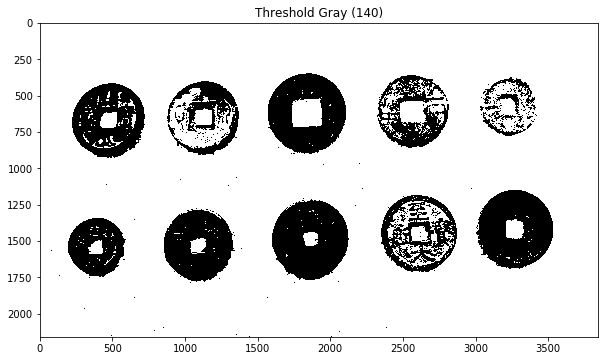

In [274]:
# imageG
ret, imageTh = cv2.threshold(imageG, 140, 255, cv2.THRESH_BINARY)
plt.imshow(imageTh[...,::-1]); plt.title("Threshold Gray (140)");

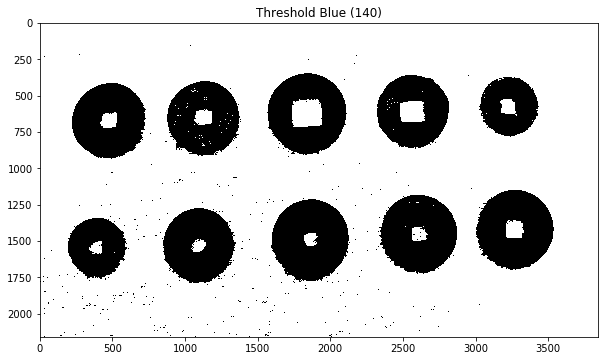

In [275]:
# NOTE: for each of the images, I tried changing the threshold (0-100) till I was able to achieve the desired result
# of getting the coins as clearly identified in the resulting image. I chose threshold of 140 for imageB
ret, imageTh = cv2.threshold(imageB, 140, 255, cv2.THRESH_BINARY)
plt.imshow(imageTh[...,::-1]); plt.title("Threshold Blue (140)");

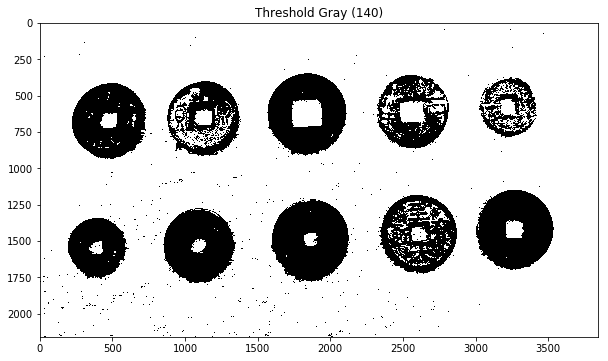

In [276]:
ret, imageTh = cv2.threshold(imageGray, 140, 255, cv2.THRESH_BINARY)
plt.imshow(imageTh[...,::-1]); plt.title("Threshold Gray (140)");

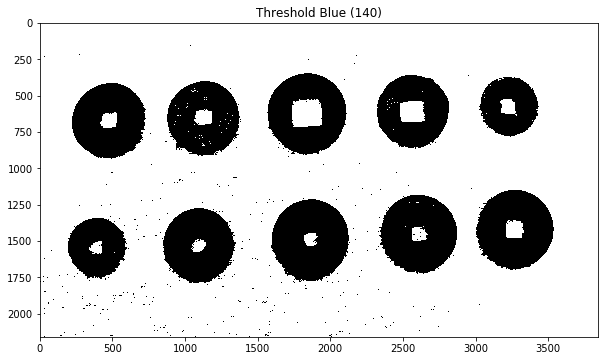

In [343]:
# chosing imageB
ret, imageTh = cv2.threshold(imageB, 140, 255, cv2.THRESH_BINARY)
plt.imshow(imageTh[...,::-1]); plt.title("Threshold Blue (140)");

## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

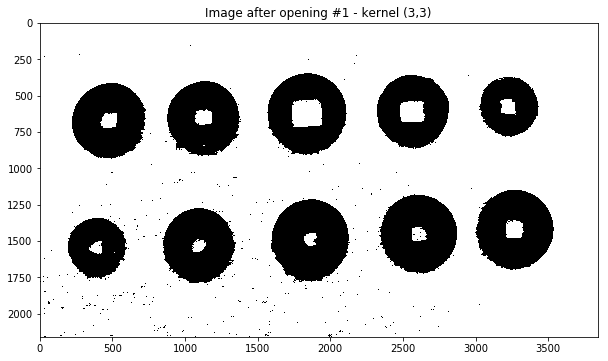

In [462]:
# Selecting a elliptical kernel to remove small white dots in the coin areas
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
imageMorphOpened = cv2.morphologyEx(imageTh, cv2.MORPH_OPEN, element,iterations=3)
plt.imshow(imageMorphOpened[...,::-1]); plt.title("Image after opening #1 - kernel (3,3)");

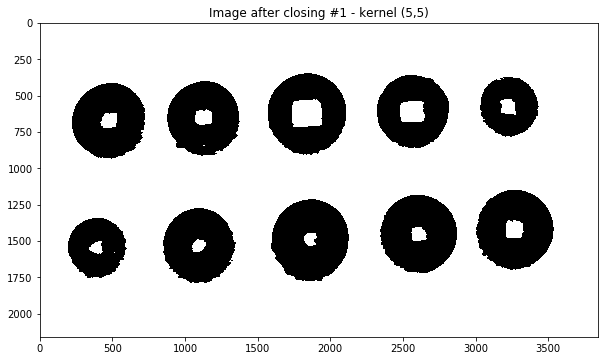

In [463]:
# Next close with a slightly bigger kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
imageMorphClosed = cv2.morphologyEx(imageMorphOpened, cv2.MORPH_CLOSE, element,iterations=3)
plt.imshow(imageMorphClosed[...,::-1]); plt.title("Image after closing #1 - kernel (5,5)");

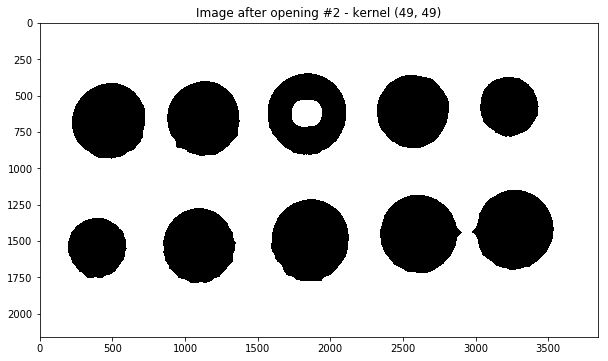

In [464]:
# use a bigger kernel to clean up the white dots in the coin areas
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (49, 49))
imageMorphOpened = cv2.morphologyEx(imageMorphClosed, cv2.MORPH_OPEN, element,iterations=3)
plt.imshow(imageMorphOpened[...,::-1]); plt.title("Image after opening #2 - kernel (49, 49)");

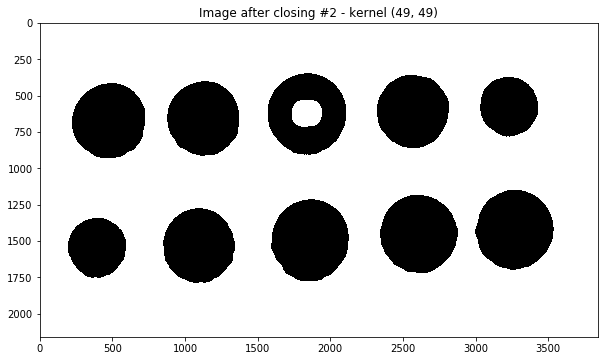

In [465]:
# close
imageMorphClosed = cv2.morphologyEx(imageMorphOpened, cv2.MORPH_CLOSE, element,iterations=3)
plt.imshow(imageMorphClosed[...,::-1]); plt.title("Image after closing #2 - kernel (49, 49)");

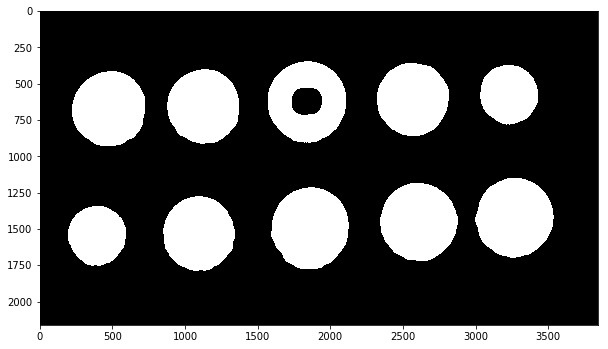

In [467]:
ret, imageTh = cv2.threshold(imageMorphClosed, 0, 255, cv2.THRESH_BINARY_INV)
plt.imshow(imageTh[...,::-1]);

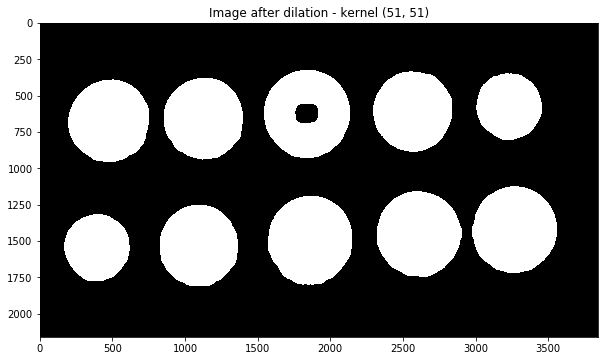

In [483]:
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (51,51))
imOpen = cv2.dilate(imageTh, element, iterations=1)
#imageMorphClosed = cv2.morphologyEx(imageTh, cv2.MORPH_CLOSE, element,iterations=3)
plt.imshow(imOpen[...,::-1]); plt.title("Image after dilation - kernel (51, 51)");

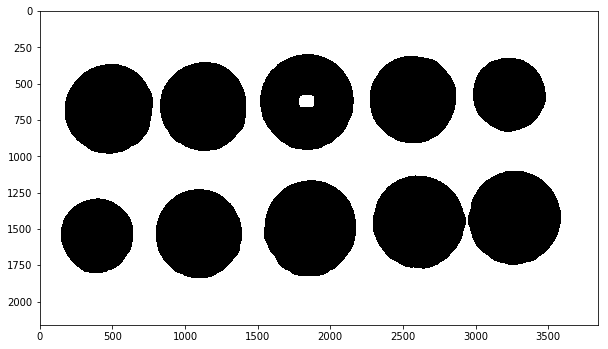

In [497]:
ret, imageTh = cv2.threshold(imOpen, 0, 255, cv2.THRESH_BINARY_INV)
plt.imshow(imageTh[...,::-1]);

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [498]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [499]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [500]:
# Detect blobs
keypoints = detector.detect(imageTh)
print('Number of coins detected = {}'.format(len(keypoints)))


Number of coins detected = 9


## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [508]:
im = image.copy()
# Mark coins using image annotation concepts we have studied so far
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in black
    cv2.circle(im,(x,y),12,(0,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    #print(x, y, radius)
    # Mark blob in black
    cv2.circle(im,(x,y),radius,(0,0,0),10)


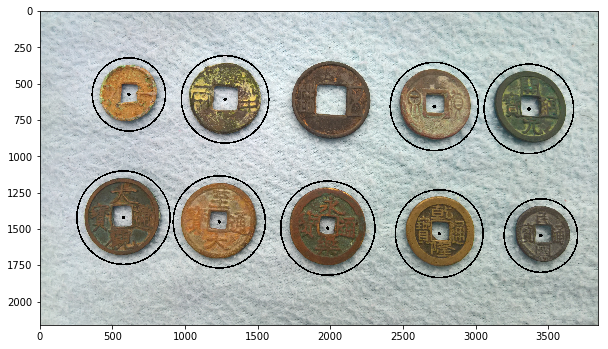

In [509]:
plt.imshow(im[...,::-1]);


**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

Number of connected components detected = 10


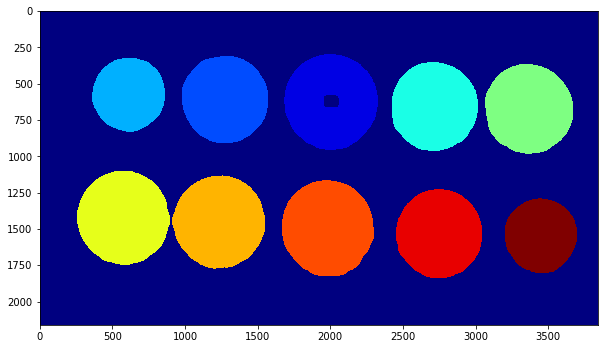

In [511]:
_, imLabels = cv2.connectedComponents(imOpen)
print('Number of connected components detected = {}'.format(imLabels.max()))
displayConnectedComponents(imLabels)
# yes, we can use CCA on the binary image to count the number of coins (even if they have holes) as the CCA will be able to 
# figure out the connected areas of each coin. We do need to ensure that the morphological operations perform leave the
# boundaries of each coin such that they do not overlap (or intersect). With that assurance, we can in fact use CCA to find
# the number of coins.

## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

Number of contours found = 12


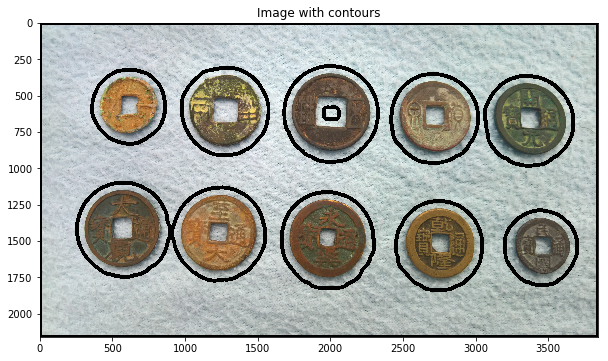

In [537]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(imageTh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# Print the number of contours found
print("Number of contours found = {}".format(len(contours)))
# Draw all contours
im = image.copy()
cv2.drawContours(im, contours, -1, (0,0,0), 25)
plt.imshow(im[:,:,::-1]); plt.title('Image with contours');

Number of contours found = 1


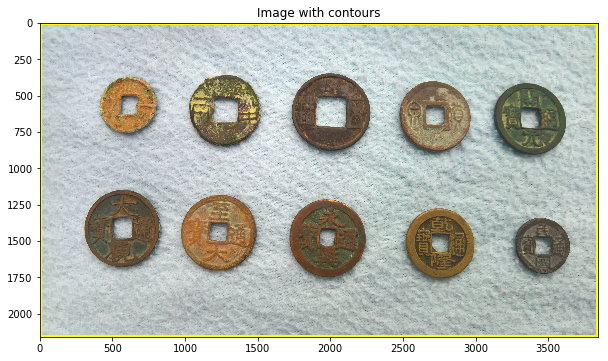

In [538]:
# Remove the inner contours
contours, hierarchy = cv2.findContours(imageTh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# Print the number of contours found
print("Number of contours found = {}".format(len(contours)))
# Display the result
im = image.copy()
cv2.drawContours(im, contours, -1, (0,255,255), 25)
plt.imshow(im[:,:,::-1]); plt.title('Image with contours');

What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [539]:
# Print area and perimeter of all contours
contours, hierarchy = cv2.findContours(imageTh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
areas = []
maxArea = 0.0
for index,ctr in enumerate(contours):
    area = cv2.contourArea(ctr)
    perimeter = cv2.arcLength(ctr, True)
    areas.append(area)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))
    if area > maxArea:
        maxArea = area

Contour #1 has area = 201003.5 and perimeter = 1676.0844744443893
Contour #2 has area = 286710.0 and perimeter = 2004.3758872747421
Contour #3 has area = 330474.0 and perimeter = 2154.6012890338898
Contour #4 has area = 317273.5 and perimeter = 2112.8439230918884
Contour #5 has area = 322973.0 and perimeter = 2135.086560487747
Contour #6 has area = 7875.5 and perimeter = 341.58073365688324
Contour #7 has area = 296051.5 and perimeter = 2038.9616698026657
Contour #8 has area = 289211.5 and perimeter = 2011.020545244217
Contour #9 has area = 200814.0 and perimeter = 1679.013412117958
Contour #10 has area = 283786.0 and perimeter = 1990.0916115045547
Contour #11 has area = 333153.0 and perimeter = 2159.9149829149246
Contour #12 has area = 8288401.0 and perimeter = 11996.0


In [540]:
# Print maximum area of contour
# This will be the box that we want to remove
print('Maximum area of contour = {}'.format(maxArea))


Maximum area of contour = 8288401.0


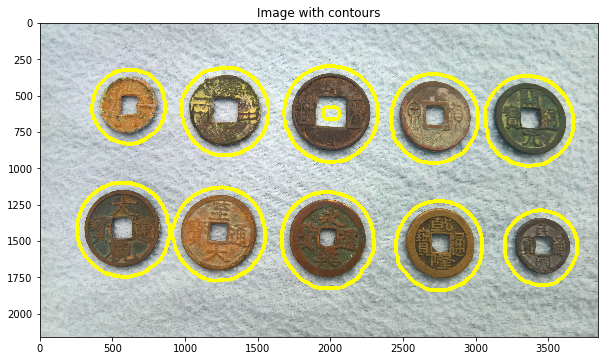

In [550]:
# Remove this contour and plot others
contoursInt = contours[:-1]
im = image.copy()
cv2.drawContours(im, contoursInt, -1, (0,255,255), 25)
plt.imshow(im[:,:,::-1]); plt.title('Image with contours');

Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [546]:
# Print sorted area of contours
print(sorted(areas))

[7875.5, 200814.0, 201003.5, 283786.0, 286710.0, 289211.5, 296051.5, 317273.5, 322973.0, 330474.0, 333153.0, 8288401.0]


Number of contours found = 10


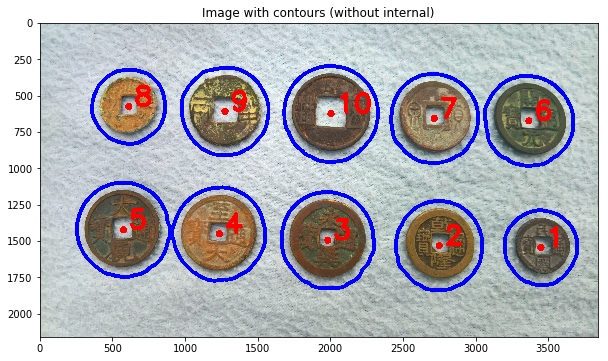

In [559]:
# Remove the inner contour
contoursInt = np.delete(contoursInt, 5)

print("Number of contours found = {}".format(len(contoursInt)))
# Plot the rest of them
im = image.copy()
cv2.drawContours(im, contoursInt, -1, (255,0,0), 25)
plt.imshow(im[:,:,::-1]); plt.title('Image with contours');
for index, ctr in enumerate(contoursInt):
    # We will use the contour moments
    # to find the centroid
    M = cv2.moments(ctr)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    
    # Mark the center
    cv2.circle(im, (x,y), 25, (0,0,255), -1);
    # Mark the contour number
    cv2.putText(im, "{}".format(index + 1), (x+40, y-10), cv2.FONT_HERSHEY_SIMPLEX, 6, (0, 0, 255), 25);
plt.imshow(im[:,:,::-1]); plt.title('Image with contours (without internal)');

Number of coins detected = 10


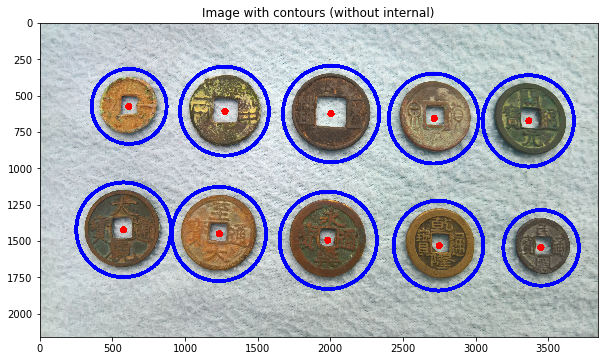

In [562]:
# Fit circles on coins
im = image.copy()
print("Number of coins detected = {}".format(len(contoursInt)))
for ctr in contoursInt:
    # Fit a circle
    ((x,y),radius) = cv2.minEnclosingCircle(ctr)
    cv2.circle(im, (int(x),int(y)), int(round(radius)), (255,0,0), 25)
    # We will use the contour moments
    # to find the centroid
    M = cv2.moments(ctr)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    
    # Mark the center
    cv2.circle(im, (x,y), 25, (0,0,255), -1);
plt.imshow(im[:,:,::-1]); plt.title('Image with contours (without internal)');